# Data Loading

In [20]:
import os
import glob
import pandas as pd
import json

# Path to the directory containing the JSON files
folder_path = 'results/'

# Get all JSON files in the directory
json_files = glob.glob(os.path.join(folder_path, '*.json'))

# Initialize empty lists to store DataFrames
client_dfs = []
server_dfs = []
central_dfs = []

# Iterate through each JSON file
for file in json_files:
    with open(file, 'r') as f:
        data = json.load(f)
    
    # Read JSON data and convert it to DataFrame
    df = pd.json_normalize(data)
    
    # Check the name to decide which DataFrame to append to
    if os.path.basename(file).startswith('quantity_skew_client'):
        client_dfs.append(df)
    elif os.path.basename(file).startswith('quantity_skew_server'):
        server_dfs.append(df)
    elif os.path.basename(file).startswith('quantity_skew_central'):
        central_dfs.append(df)
    #elif os.path.basename(file).startswith('central'):
    #    central_dfs.append(df)


# Concatenate the lists of DataFrames into single DataFrames
client_df = pd.concat(client_dfs, ignore_index=True)
server_df = pd.concat(server_dfs, ignore_index=True)
central_df = pd.concat(central_dfs, ignore_index=True)

# Now you have three DataFrames: client_df, server_df, and central_df
# Columns to drop
client_columns_to_drop = ["output", "heterogeneity", "type", "seed","federated_rounds","federated_local_epochs","number_of_clusters"]
client_df.drop(columns=client_columns_to_drop, inplace=True)
server_columns_to_drop = ["output", "heterogeneity", "type", "seed","number_of_clusters"]
server_df.drop(columns=server_columns_to_drop, inplace=True)

new_column_names = {"number_of_clients": "clients", "number_of_samples_of_each_labels_by_clients": "samples"}
central_df.rename(columns=new_column_names, inplace=True)
# Rename the columns in each DataFrame
new_column_names = {"number_of_clients": "clients", "number_of_samples_of_each_labels_by_clients": "samples","davies_bouldin_index": "dbi"}
client_df.rename(columns=new_column_names, inplace=True)
server_df.rename(columns=new_column_names, inplace=True)



# CENTRALIZED/ CLASSIC FL

In [21]:
central_df = central_df.sort_values(by='clients', ascending=False)
central_df['total'] = central_df['samples']*central_df['clients']
central_df = central_df.sort_values(by=['clients','total','samples'], ascending=True)
central_df.drop(columns=['seed','centralized_model_epochs','federated_rounds',	'federated_local_epochs','number_of_clusters','output','heterogeneity','type','federated std'], inplace=True)
central_df.transpose()

,0
clients,48.000000
samples,150.000000
central,97.339593
personalized central (0.1),85.679012
federated 0.1,84.938272
personalized central (0.5),93.777778
federated 0.5,93.432099
personalized central (0.05),83.068783
federated 0.05,78.835979
personalized central (0.25),91.291291


In [22]:
import numpy as np
# Assuming central_df is your DataFrame
# Replace 'central_df' with the name of your DataFrame
columns_with_personalized = [col for col in central_df.columns if 'personalized central ' in col]
columns_with_fed = [col for col in central_df.columns if 'federated ' in col]

# Calculate mean and standard deviation for each column with 'personalized central'
mean_values = central_df[columns_with_personalized].mean(axis=1)
std_values = central_df[columns_with_personalized].std(axis=1)
                    

# Inject mean and standard deviation as new columns
central_df['mean_personalized'] = mean_values
central_df['std_personalized'] = std_values

# Calculate mean and standard deviation for each column with 'federated'
mean_values_fed = central_df[columns_with_fed].mean(axis=1)
std_values_fed = central_df[columns_with_fed].std(axis=1)
# Inject mean and standard deviation as new columns
central_df['mean_federated_personalized'] = mean_values_fed
central_df['std_federated_personalized'] = std_values_fed



central_df.transpose()


,0
clients,48.000000
samples,150.000000
central,97.339593
personalized central (0.1),85.679012
federated 0.1,84.938272
personalized central (0.5),93.777778
federated 0.5,93.432099
personalized central (0.05),83.068783
federated 0.05,78.835979
personalized central (0.25),91.291291


# CFL CLIENT SIDE

In [25]:
client_df.columns

Index(['clients', 'samples', 'silhouette', 'avg_intra_dist', 'duhn_index',
       'dbi', 'Cluster 0.num_members', 'Cluster 0.accuracy', 'Cluster 0.std',
       'Cluster 0.members_heterogeneity.0.05',
       'Cluster 0.members_heterogeneity.0.1',
       'Cluster 0.members_heterogeneity.0.25',
       'Cluster 0.members_heterogeneity.0.5',
       'Cluster 0.members_heterogeneity.1', 'Cluster 1.num_members',
       'Cluster 1.accuracy', 'Cluster 1.std',
       'Cluster 1.members_heterogeneity.0.1', 'Cluster 3.num_members',
       'Cluster 3.accuracy', 'Cluster 3.std',
       'Cluster 3.members_heterogeneity.0.05', 'Cluster 4.num_members',
       'Cluster 4.accuracy', 'Cluster 4.std',
       'Cluster 4.members_heterogeneity.0.05',
       'Cluster 4.members_heterogeneity.0.1',
       'Cluster 4.members_heterogeneity.0.5', 'total'],
      dtype='object')

In [26]:
client_df['total'] = client_df['samples']*client_df['clients']
client_df = client_df.sort_values(by=['total','samples'], ascending=True)
print('CLIENT SIDE')
display(client_df.transpose())


CLIENT SIDE


,0
clients,48
samples,150
silhouette,0.934387
avg_intra_dist,0.028623
duhn_index,14.871132
dbi,None
Cluster 0.num_members,40
Cluster 0.accuracy,96.121021
Cluster 0.std,1.582509
Cluster 0.members_heterogeneity.0.05,7


In [27]:
from IPython.display import display
client_df = client_df.sort_values(by='clients', ascending=True)
# Select the columns for each DataFrame
display(client_df[['clients','samples','silhouette',	'avg_intra_dist',	'duhn_index', 'dbi']])
# Create new DataFrames
cluster_columns = [col for col in client_df.columns if col.startswith('Cluster')]
cluster_dfs = {}
for i in range(5):  # Assuming you want to create 4 new DataFrames
    cluster_dfs[i] = client_df[['clients', 'samples'] + [col for col in cluster_columns if col.startswith(f'Cluster {i}')]]
    display(cluster_dfs[i].transpose())

,clients,samples,silhouette,avg_intra_dist,duhn_index,dbi
0,48,150,0.934387,0.028623,14.871132,None


,0
clients,48.000000
samples,150.000000
Cluster 0.num_members,40.000000
Cluster 0.accuracy,96.121021
Cluster 0.std,1.582509
Cluster 0.members_heterogeneity.0.05,7.000000
Cluster 0.members_heterogeneity.0.1,7.000000
Cluster 0.members_heterogeneity.0.25,9.000000
Cluster 0.members_heterogeneity.0.5,8.000000
Cluster 0.members_heterogeneity.1,9.000000


,0
clients,48.000000
samples,150.000000
Cluster 1.num_members,1.000000
Cluster 1.accuracy,73.333333
Cluster 1.std,0.000000
Cluster 1.members_heterogeneity.0.1,1.000000


,0
clients,48
samples,150


,0
clients,48.000000
samples,150.000000
Cluster 3.num_members,1.000000
Cluster 3.accuracy,61.904762
Cluster 3.std,0.000000
Cluster 3.members_heterogeneity.0.05,1.000000


,0
clients,48.000000
samples,150.000000
Cluster 4.num_members,3.000000
Cluster 4.accuracy,82.201058
Cluster 4.std,3.303350
Cluster 4.members_heterogeneity.0.05,1.000000
Cluster 4.members_heterogeneity.0.1,1.000000
Cluster 4.members_heterogeneity.0.5,1.000000


In [33]:
display(client_df[['Cluster 0.accuracy','Cluster 1.accuracy','Cluster 3.accuracy','Cluster 4.accuracy']].mean(axis=1))
client_df[['Cluster 0.accuracy','Cluster 1.accuracy','Cluster 3.accuracy','Cluster 4.accuracy']].std(axis=1)

0    78.390044
dtype: float64

0    14.44814
dtype: float64

## Histogram Client SIDE

IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

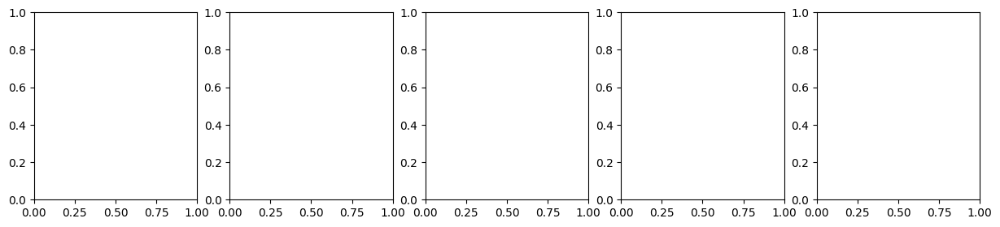

In [28]:
import pandas as pd
import matplotlib.pyplot as plt
# Assuming your DataFrame is named df
df = client_df

# Add new columns and set values to 0
#new_columns = ['Cluster 2.members_heterogeneity.dilatation', 'Cluster 2.members_heterogeneity.none']
#df = df.assign(**{col: 0 for col in new_columns})

# Selecting the columns of interest for each cluster
columns_of_interest_cluster0 = ['Cluster 0.members_heterogeneity.0.05', 
                                'Cluster 0.members_heterogeneity.0.1',
                                'Cluster 0.members_heterogeneity.0.25',
                                'Cluster 0.members_heterogeneity.0.5',
                                'Cluster 0.members_heterogeneity.1'
                                ]

columns_of_interest_cluster1 = ['Cluster 1.members_heterogeneity.0.05', 
                                'Cluster 1.members_heterogeneity.0.1',
                                'Cluster 1.members_heterogeneity.0.25',
                                'Cluster 1.members_heterogeneity.0.5',
                                'Cluster 1.members_heterogeneity.1'
                                ]


columns_of_interest_cluster2 = ['Cluster 2.members_heterogeneity.0.05', 
                                'Cluster 2.members_heterogeneity.0.1',
                                'Cluster 2.members_heterogeneity.0.25',
                                'Cluster 2.members_heterogeneity.0.5',
                                'Cluster 2.members_heterogeneity.1'
                                ]


columns_of_interest_cluster3 = ['Cluster 3.members_heterogeneity.0.05', 
                                'Cluster 3.members_heterogeneity.0.1',
                                'Cluster 3.members_heterogeneity.0.25',
                                'Cluster 3.members_heterogeneity.0.5',
                                'Cluster 3.members_heterogeneity.1'
                                ]
columns_of_interest_cluster4 = ['Cluster 4.members_heterogeneity.0.05', 
                                'Cluster 4.members_heterogeneity.0.1',
                                'Cluster 4.members_heterogeneity.0.25',
                                'Cluster 4.members_heterogeneity.0.5',
                                'Cluster 4.members_heterogeneity.1'
                                ]
columns_of_interest_cluster5 = ['Cluster 4.members_heterogeneity.0.05', 
                                'Cluster 4.members_heterogeneity.0.1',
                                'Cluster 4.members_heterogeneity.0.25',
                                'Cluster 4.members_heterogeneity.0.5',
                                'Cluster 4.members_heterogeneity.1'
                                ]

columns_to_search = columns_of_interest_cluster0+ columns_of_interest_cluster1 +columns_of_interest_cluster2 + columns_of_interest_cluster3 + columns_of_interest_cluster4 
for column in columns_to_search:
    if column not in df.columns:
        df[column] = 0
# Creating subplots
fig, axs = plt.subplots(len(df), len(columns_of_interest_cluster0), figsize=(3*len(columns_of_interest_cluster0), 3*len(df)))

# Plotting bar plots for each row and each cluster
for i, (index, row) in enumerate(df.iterrows()):
    sample_name = row['samples']  # Get the value of 'samples' column for the current row
    max_value = max(row[columns_of_interest_cluster0].max(),
                    row[columns_of_interest_cluster1].max(),
                    row[columns_of_interest_cluster2].max(),row[columns_of_interest_cluster3].max(),row[columns_of_interest_cluster4].max())
    
    for j, columns_of_interest in enumerate([columns_of_interest_cluster0,
                                             columns_of_interest_cluster1,
                                             columns_of_interest_cluster2,columns_of_interest_cluster3,columns_of_interest_cluster4]):
        axs[i, j].bar(range(len(columns_of_interest)), row[columns_of_interest], align='center')
        axs[i, j].set_xticks(range(len(columns_of_interest)))
        axs[i, j].set_xticklabels(['Swap (1,7)','Swap (2,7)','Swap (4,7)', 'Swap (3,8)', 'Swap (5,6)'], rotation=90)
        axs[i, j].set_title(f"Cluster {j} ")
        accuracy = row[f'Cluster {j}.accuracy']
        axs[i, j].set_xlabel(f"accuracy : {accuracy:.2f}")
        axs[i, j].set_ylabel(f" Sample: {sample_name}")
        axs[i, j].set_ylim(0, max_value)  # Set y-axis limits to the maximum value across all clusters

plt.tight_layout()
plt.show()

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (5,) and arg 1 with shape (10,).

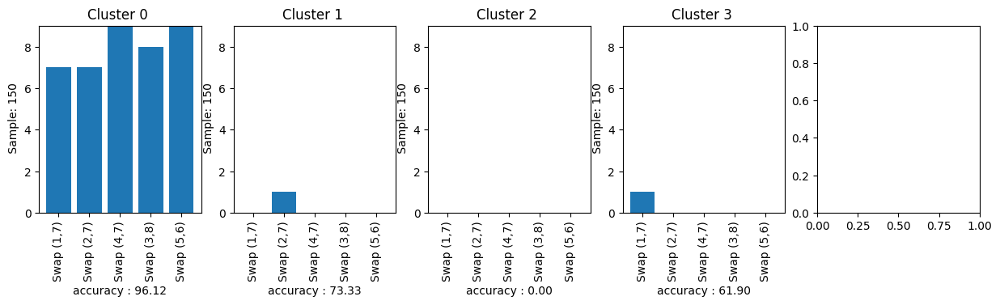

In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming your DataFrame is named df
df = client_df

# Add new columns and set values to 0 if they don't exist
columns_to_add = [
    'Cluster 2.members_heterogeneity.dilatation', 'Cluster 2.members_heterogeneity.none',
    'Cluster 4.members_heterogeneity.0.05', 'Cluster 4.members_heterogeneity.0.1',
    'Cluster 4.members_heterogeneity.0.25', 'Cluster 4.members_heterogeneity.0.5',
    'Cluster 4.members_heterogeneity.1'
]
df = df.reindex(columns=df.columns.tolist() + columns_to_add, fill_value=0)

# Selecting the columns of interest for each cluster
columns_of_interest_cluster0 = ['Cluster 0.members_heterogeneity.0.05', 
                                'Cluster 0.members_heterogeneity.0.1',
                                'Cluster 0.members_heterogeneity.0.25',
                                'Cluster 0.members_heterogeneity.0.5',
                                'Cluster 0.members_heterogeneity.1'
                               ]

columns_of_interest_cluster1 = ['Cluster 1.members_heterogeneity.0.05', 
                                'Cluster 1.members_heterogeneity.0.1',
                                'Cluster 1.members_heterogeneity.0.25',
                                'Cluster 1.members_heterogeneity.0.5',
                                'Cluster 1.members_heterogeneity.1'
                               ]

columns_of_interest_cluster2 = ['Cluster 2.members_heterogeneity.0.05', 
                                'Cluster 2.members_heterogeneity.0.1',
                                'Cluster 2.members_heterogeneity.0.25',
                                'Cluster 2.members_heterogeneity.0.5',
                                'Cluster 2.members_heterogeneity.1'
                               ]

columns_of_interest_cluster3 = ['Cluster 3.members_heterogeneity.0.05', 
                                'Cluster 3.members_heterogeneity.0.1',
                                'Cluster 3.members_heterogeneity.0.25',
                                'Cluster 3.members_heterogeneity.0.5',
                                'Cluster 3.members_heterogeneity.1'
                               ]

columns_of_interest_cluster4 = ['Cluster 4.members_heterogeneity.0.05', 
                                'Cluster 4.members_heterogeneity.0.1',
                                'Cluster 4.members_heterogeneity.0.25',
                                'Cluster 4.members_heterogeneity.0.5',
                                'Cluster 4.members_heterogeneity.1'
                               ]

columns_to_search = columns_of_interest_cluster0 + columns_of_interest_cluster1 + columns_of_interest_cluster2 + columns_of_interest_cluster3 + columns_of_interest_cluster4

# Ensure all necessary columns exist in the dataframe
for column in columns_to_search:
    if column not in df.columns:
        df[column] = 0

# Creating subplots
fig, axs = plt.subplots(len(df), len(columns_of_interest_cluster0), figsize=(3*len(columns_of_interest_cluster0), 3*len(df)))
axs = np.atleast_2d(axs)

# Plotting bar plots for each row and each cluster
for i, (index, row) in enumerate(df.iterrows()):
    sample_name = row['samples']  # Get the value of 'samples' column for the current row
    max_value = max(row[columns_of_interest_cluster0].max(),
                    row[columns_of_interest_cluster1].max(),
                    row[columns_of_interest_cluster2].max(),
                    row[columns_of_interest_cluster3].max(),
                    row[columns_of_interest_cluster4].max())
    
    for j, columns_of_interest in enumerate([
        columns_of_interest_cluster0,
        columns_of_interest_cluster1,
        columns_of_interest_cluster2,
        columns_of_interest_cluster3,
        columns_of_interest_cluster4
    ]):
        axs[i, j].bar(range(len(columns_of_interest)), row[columns_of_interest], align='center')
        axs[i, j].set_xticks(range(len(columns_of_interest)))
        axs[i, j].set_xticklabels(['Swap (1,7)','Swap (2,7)','Swap (4,7)', 'Swap (3,8)', 'Swap (5,6)'], rotation=90)
        axs[i, j].set_title(f"Cluster {j} ")
        accuracy = row.get(f'Cluster {j}.accuracy', 0)
        axs[i, j].set_xlabel(f"accuracy : {accuracy:.2f}")
        axs[i, j].set_ylabel(f" Sample: {sample_name}")
        axs[i, j].set_ylim(0, max_value)  # Set y-axis limits to the maximum value across all clusters

plt.tight_layout()
plt.show()


## Plot T-SNE Client SIDE

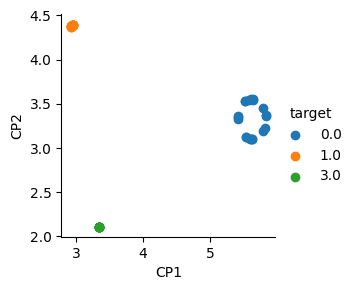

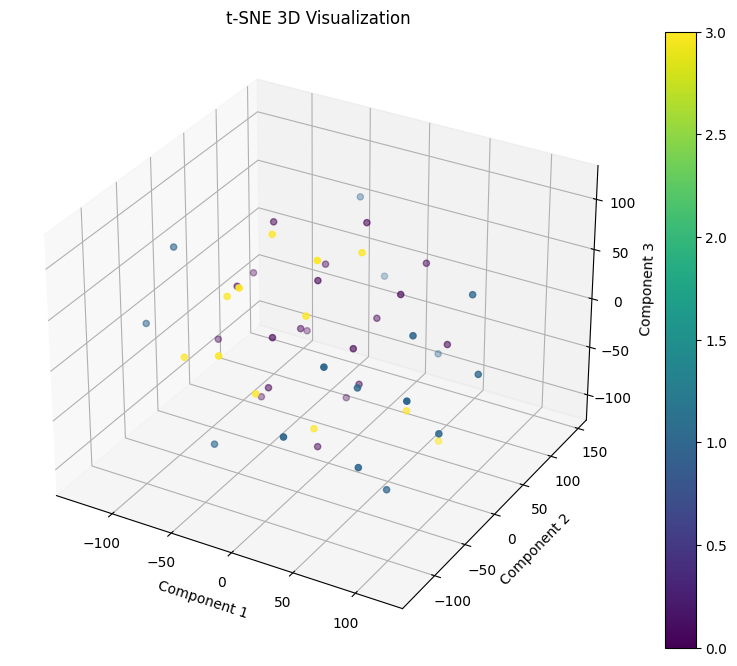

In [11]:
import pickle
import pandas as pd
df = pd.read_pickle('./results/quantity_skew_client48_client_weights.pkl')
cluster = df['cluster']
df.drop(columns='cluster')
print('')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from sklearn import manifold
import sklearn.manifold._t_sne as tsne
X = df
y= cluster
tsne = manifold.TSNE(n_components=2, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2', 'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
grid = sns.FacetGrid(tsne_df, hue="target")
grid.map(plt.scatter, 'CP1', 'CP2').add_legend()
X = df
y= cluster
tsne = manifold.TSNE(n_components=3, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2','CP3' ,'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot using Matplotlib directly
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points
scatter = ax.scatter(tsne_df['CP1'], tsne_df['CP2'], tsne_df['CP3'], c=tsne_df['target'], cmap='viridis')

# Set labels and title
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.set_title('t-SNE 3D Visualization')

# Add color bar
plt.colorbar(scatter)

plt.show()

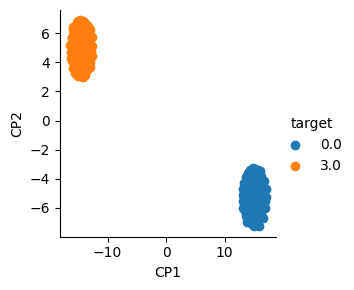

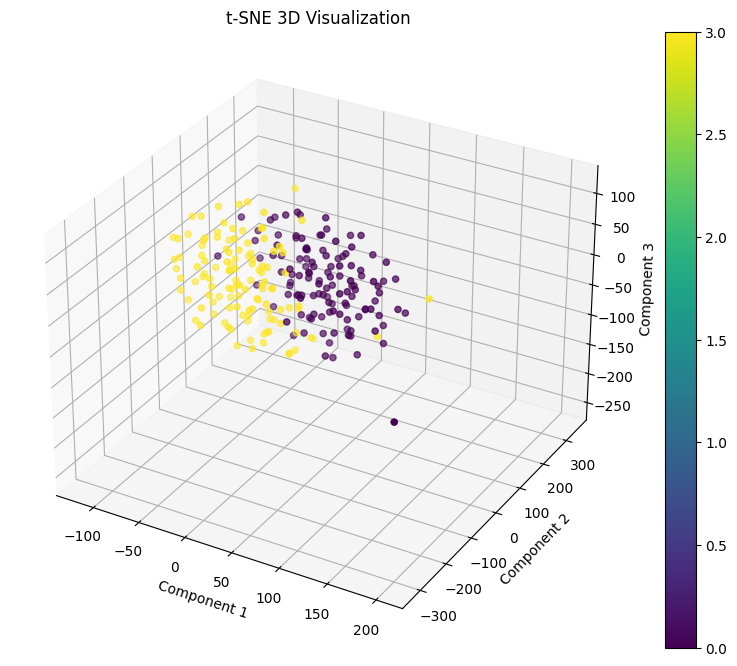

In [13]:
import pickle
import pandas as pd
df = pd.read_pickle('./results/quantity_skew_client240_client_weights.pkl')
cluster = df['cluster']
df.drop(columns='cluster')
print('')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from sklearn import manifold
import sklearn.manifold._t_sne as tsne
X = df
y= cluster
tsne = manifold.TSNE(n_components=2, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2', 'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
grid = sns.FacetGrid(tsne_df, hue="target")
grid.map(plt.scatter, 'CP1', 'CP2').add_legend()
X = df
y= cluster
tsne = manifold.TSNE(n_components=3, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2','CP3' ,'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot using Matplotlib directly
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points
scatter = ax.scatter(tsne_df['CP1'], tsne_df['CP2'], tsne_df['CP3'], c=tsne_df['target'], cmap='viridis')

# Set labels and title
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.set_title('t-SNE 3D Visualization')

# Add color bar
plt.colorbar(scatter)

plt.show()

## Plot weight heatmap Client SIDE

In [14]:
import torch
import glob
import os

from src.models import SimpleLinear
from src.metrics import plot_weights_heatmap
model = SimpleLinear()

# Define the directories
central_dir = "./results/quantity_skew_central"
client_dir = "./results/quantity_skew_client"
server_dir = "./results/quantity_skew_server"

# Function to load .pth files from a directory into a dictionary
def load_pth_files(directory):
    pth_files = glob.glob(directory + "*.pth")
    models_dict = {}
    for pth_file in pth_files:
        filename = os.path.basename(pth_file)[:-4]  # Remove ".pth" extension
        model = torch.load(pth_file)
        models_dict[filename] = model
    return models_dict

# Load models from each directory
central_models_dict = load_pth_files(central_dir)
client_models_dict = load_pth_files(client_dir)
server_models_dict = load_pth_files(server_dir)

In [15]:
import matplotlib.pyplot as plt
def plot_weights_heatmap(model,title,title2 = '', v_value=0.1 ):
    # Get the weights of the first and second layers
    first_layer_weights = model.fc1.weight.data.numpy()
    second_layer_weights = model.fc2.weight.data.numpy()

    # Create custom colormap
    cmap = 'coolwarm'

    # Plot the input weights of the first layer
    plt.figure(figsize=(5, 3))

    #plt.subplot(2, 1, 1)
    plt.imshow(first_layer_weights, cmap=cmap, aspect='auto', vmin=-v_value, vmax=v_value)
    plt.title(title)
    plt.xlabel('Input Pixel (784)')
    plt.ylabel('Neuron in Hidden Layer (200)')
    plt.colorbar(label='Weight Value')
    plt.tight_layout()
    #plt.savefig(title + '.jpg')  
    plt.show()

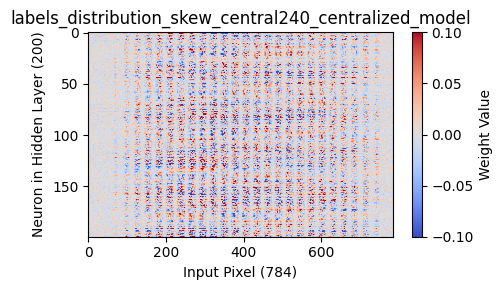

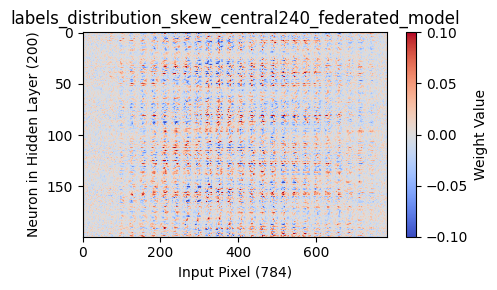

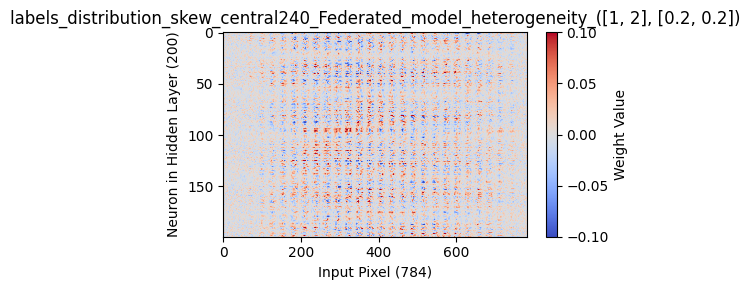

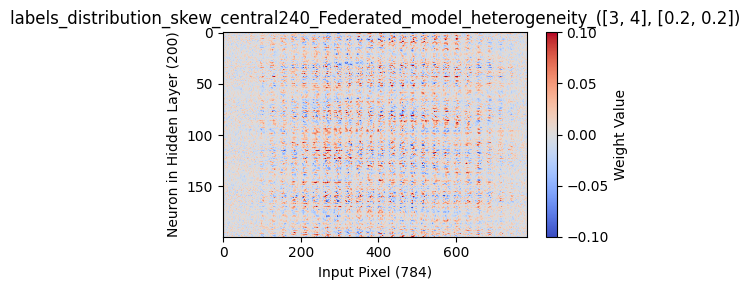

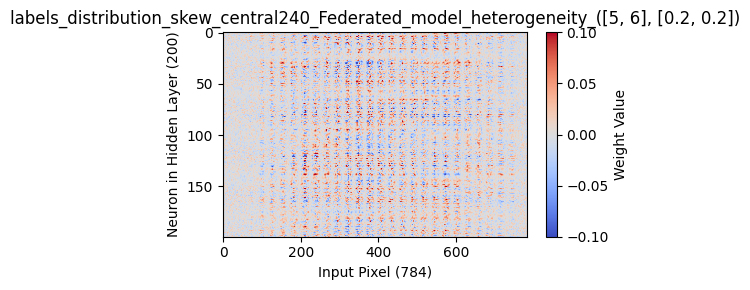

...

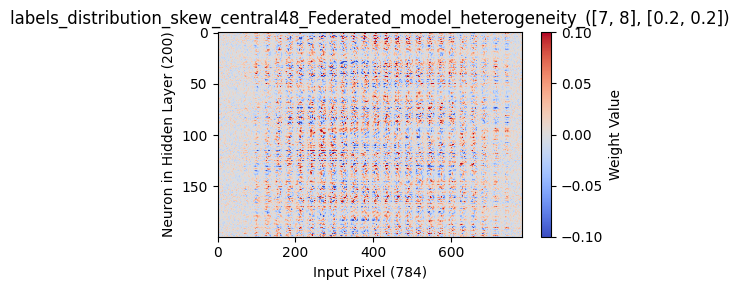

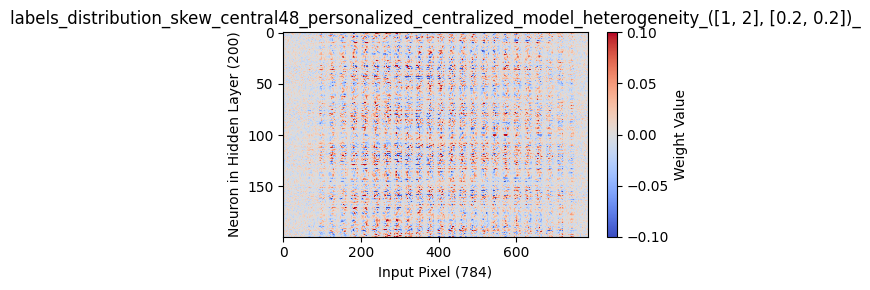

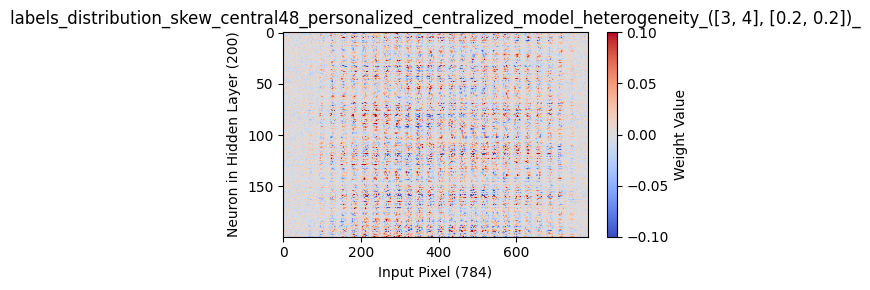

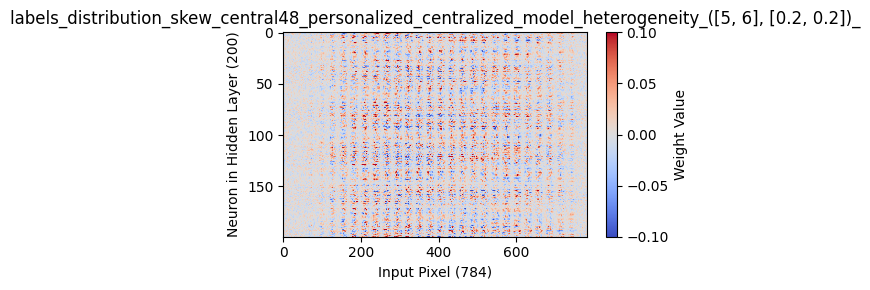

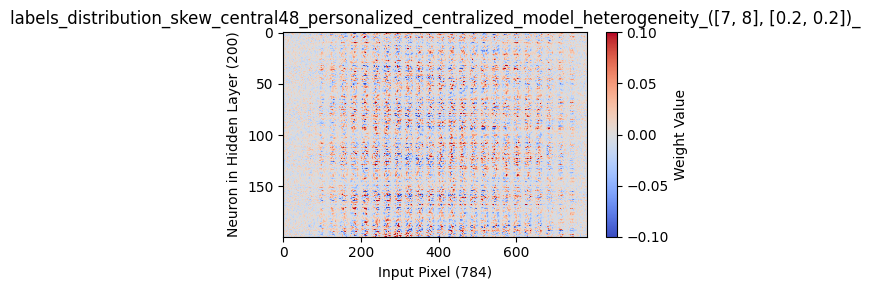

In [16]:
key_list =[]
for key in central_models_dict.keys() :
    key_list.append(key)
for key in key_list :
    model.load_state_dict(central_models_dict[key])
    plot_weights_heatmap(model,key)

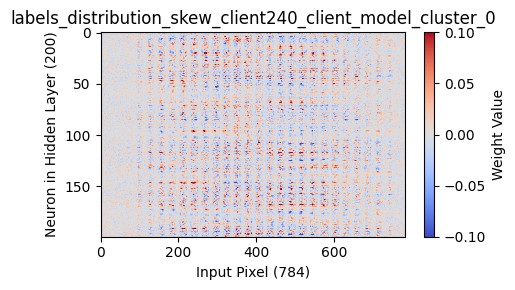

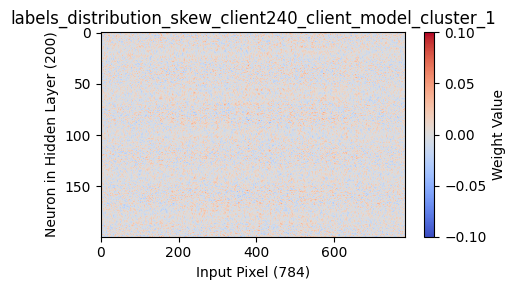

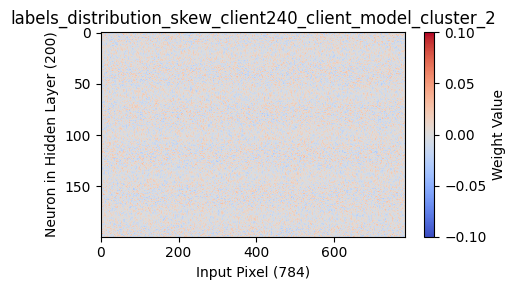

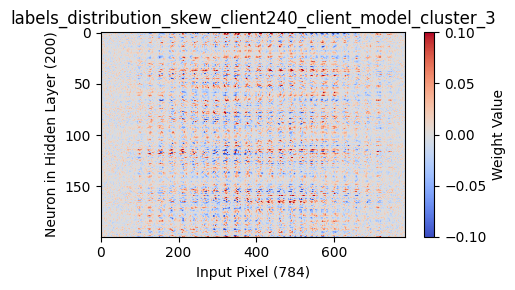

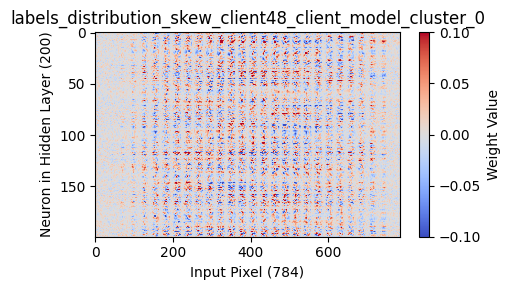

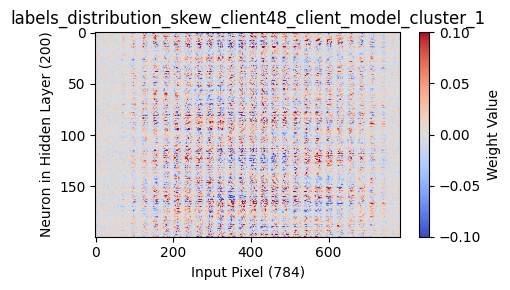

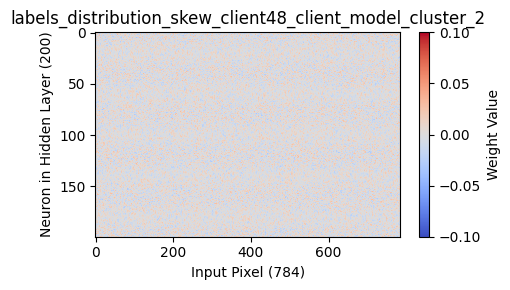

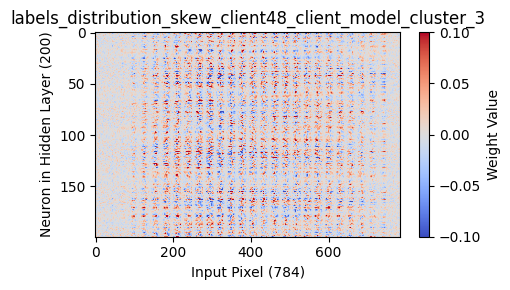

In [17]:
key_list =[]
for key in client_models_dict.keys() :
    key_list.append(key)
for key in key_list :
    model.load_state_dict(client_models_dict[key])
    plot_weights_heatmap(model,key)

# CFL SERVER SIDE

In [30]:
server_df['total'] = server_df['samples']*server_df['clients']
print('SERVERSIDE')
server_df = server_df.sort_values(by=['total','samples'], ascending=True)
display(server_df.transpose())

SERVERSIDE


,0
clients,48.000000
samples,150.000000
cfl_before_cluster_rounds,50.000000
cfl_after_cluster_rounds,50.000000
cfl_local_epochs,50.000000
silhouette,0.835381
avg_intra_dist,0.082041
duhn_index,3.204093
dbi,0.086628
Cluster 0.num_members,1.000000


In [31]:
from IPython.display import display
server_df = server_df.sort_values(by='clients', ascending=True)
# Select the columns for each DataFrame
display(server_df[['clients','samples','silhouette',	'avg_intra_dist',	'duhn_index', 'dbi']])
# Create new DataFrames
cluster_columns = [col for col in server_df.columns if col.startswith('Cluster')]
cluster_dfs = {}
for i in range(5):  # Assuming you want to create 4 new DataFrames
    cluster_dfs[i] = server_df[['clients', 'samples'] + [col for col in cluster_columns if col.startswith(f'Cluster {i}')]]
    display(cluster_dfs[i].transpose())

,clients,samples,silhouette,avg_intra_dist,duhn_index,dbi
0,48,150,0.835381,0.082041,3.204093,0.086628


,0
clients,48.000000
samples,150.000000
Cluster 0.num_members,1.000000
Cluster 0.accuracy,97.111111
Cluster 0.std,0.000000
Cluster 0.members_heterogeneity.1,1.000000


,0
clients,48.000000
samples,150.000000
Cluster 1.num_members,10.000000
Cluster 1.accuracy,96.377778
Cluster 1.std,1.155983
Cluster 1.members_heterogeneity.0.4,3.000000
Cluster 1.members_heterogeneity.1,7.000000


,0
clients,48.000000
samples,150.000000
Cluster 2.num_members,1.000000
Cluster 2.accuracy,95.777778
Cluster 2.std,0.000000
Cluster 2.members_heterogeneity.1,1.000000


,0
clients,48.000000
samples,150.000000
Cluster 3.num_members,35.000000
Cluster 3.accuracy,96.000000
Cluster 3.std,2.423722
Cluster 3.members_heterogeneity.0.1,16.000000
Cluster 3.members_heterogeneity.0.4,13.000000
Cluster 3.members_heterogeneity.1,6.000000


,0
clients,48.000000
samples,150.000000
Cluster 4.num_members,1.000000
Cluster 4.accuracy,96.222222
Cluster 4.std,0.000000
Cluster 4.members_heterogeneity.1,1.000000


In [34]:
display(server_df[['Cluster 0.accuracy','Cluster 1.accuracy','Cluster 2.accuracy','Cluster 3.accuracy','Cluster 4.accuracy']].mean(axis=1))
server_df[['Cluster 0.accuracy','Cluster 1.accuracy','Cluster 2.accuracy','Cluster 3.accuracy','Cluster 4.accuracy']].std(axis=1)

0    96.297778
dtype: float64

0    0.508107
dtype: float64

## Histogram Server SIDE

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (5,) and arg 1 with shape (6,).

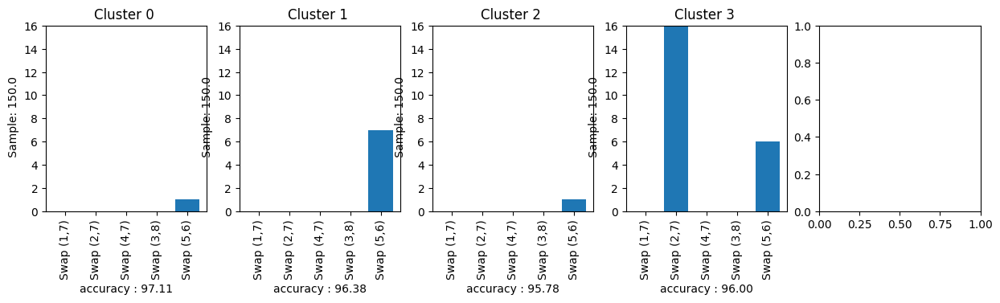

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Assuming your DataFrame is named df
df = server_df

# Add new columns and set values to 0 if they don't exist
columns_to_add = [
    'Cluster 2.members_heterogeneity.dilatation', 'Cluster 2.members_heterogeneity.none',
    'Cluster 4.members_heterogeneity.0.05', 'Cluster 4.members_heterogeneity.0.1',
    'Cluster 4.members_heterogeneity.0.25', 'Cluster 4.members_heterogeneity.0.5',
    'Cluster 4.members_heterogeneity.1'
]
df = df.reindex(columns=df.columns.tolist() + columns_to_add, fill_value=0)

# Selecting the columns of interest for each cluster
columns_of_interest_cluster0 = ['Cluster 0.members_heterogeneity.0.05', 
                                'Cluster 0.members_heterogeneity.0.1',
                                'Cluster 0.members_heterogeneity.0.25',
                                'Cluster 0.members_heterogeneity.0.5',
                                'Cluster 0.members_heterogeneity.1'
                               ]

columns_of_interest_cluster1 = ['Cluster 1.members_heterogeneity.0.05', 
                                'Cluster 1.members_heterogeneity.0.1',
                                'Cluster 1.members_heterogeneity.0.25',
                                'Cluster 1.members_heterogeneity.0.5',
                                'Cluster 1.members_heterogeneity.1'
                               ]

columns_of_interest_cluster2 = ['Cluster 2.members_heterogeneity.0.05', 
                                'Cluster 2.members_heterogeneity.0.1',
                                'Cluster 2.members_heterogeneity.0.25',
                                'Cluster 2.members_heterogeneity.0.5',
                                'Cluster 2.members_heterogeneity.1'
                               ]

columns_of_interest_cluster3 = ['Cluster 3.members_heterogeneity.0.05', 
                                'Cluster 3.members_heterogeneity.0.1',
                                'Cluster 3.members_heterogeneity.0.25',
                                'Cluster 3.members_heterogeneity.0.5',
                                'Cluster 3.members_heterogeneity.1'
                               ]

columns_of_interest_cluster4 = ['Cluster 4.members_heterogeneity.0.05', 
                                'Cluster 4.members_heterogeneity.0.1',
                                'Cluster 4.members_heterogeneity.0.25',
                                'Cluster 4.members_heterogeneity.0.5',
                                'Cluster 4.members_heterogeneity.1'
                               ]

columns_to_search = columns_of_interest_cluster0 + columns_of_interest_cluster1 + columns_of_interest_cluster2 + columns_of_interest_cluster3 + columns_of_interest_cluster4

# Ensure all necessary columns exist in the dataframe
for column in columns_to_search:
    if column not in df.columns:
        df[column] = 0

# Creating subplots
fig, axs = plt.subplots(len(df), len(columns_of_interest_cluster0), figsize=(3*len(columns_of_interest_cluster0), 3*len(df)))
axs = np.atleast_2d(axs)

# Plotting bar plots for each row and each cluster
for i, (index, row) in enumerate(df.iterrows()):
    sample_name = row['samples']  # Get the value of 'samples' column for the current row
    max_value = max(row[columns_of_interest_cluster0].max(),
                    row[columns_of_interest_cluster1].max(),
                    row[columns_of_interest_cluster2].max(),
                    row[columns_of_interest_cluster3].max(),
                    row[columns_of_interest_cluster4].max())
    
    for j, columns_of_interest in enumerate([
        columns_of_interest_cluster0,
        columns_of_interest_cluster1,
        columns_of_interest_cluster2,
        columns_of_interest_cluster3,
        columns_of_interest_cluster4
    ]):
        axs[i, j].bar(range(len(columns_of_interest)), row[columns_of_interest], align='center')
        axs[i, j].set_xticks(range(len(columns_of_interest)))
        axs[i, j].set_xticklabels(['Swap (1,7)','Swap (2,7)','Swap (4,7)', 'Swap (3,8)', 'Swap (5,6)'], rotation=90)
        axs[i, j].set_title(f"Cluster {j} ")
        accuracy = row.get(f'Cluster {j}.accuracy', 0)
        axs[i, j].set_xlabel(f"accuracy : {accuracy:.2f}")
        axs[i, j].set_ylabel(f" Sample: {sample_name}")
        axs[i, j].set_ylim(0, max_value)  # Set y-axis limits to the maximum value across all clusters

plt.tight_layout()
plt.show()


## Plot T-SNE Server SIDE

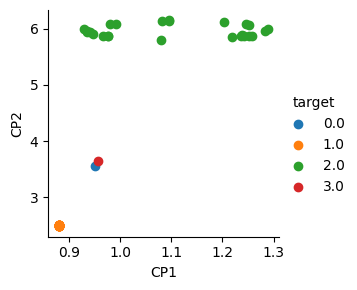

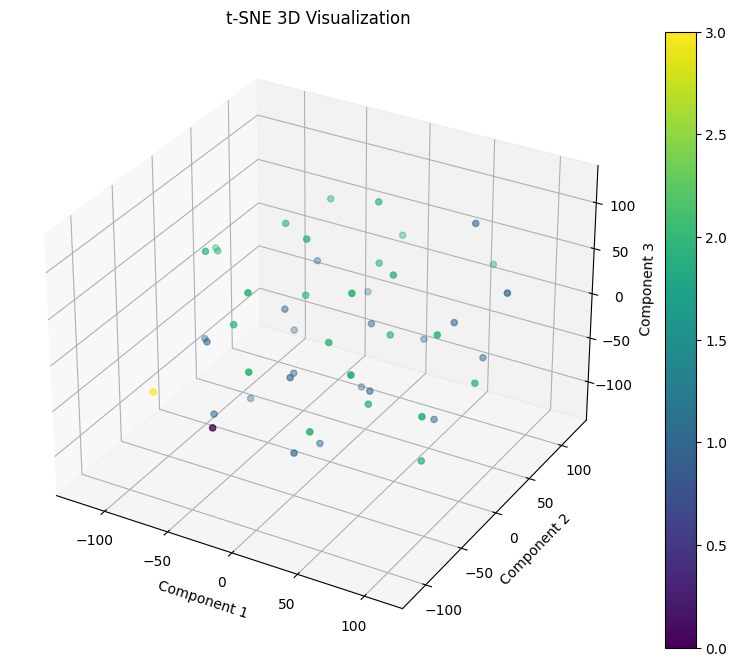

In [21]:
import pickle
import pandas as pd
df = pd.read_pickle('./results/quantity_skew_server48_client_weights.pkl')
cluster = df['cluster']
df.drop(columns='cluster')
print('')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from sklearn import manifold
import sklearn.manifold._t_sne as tsne
X = df
y= cluster
tsne = manifold.TSNE(n_components=2, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2', 'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
grid = sns.FacetGrid(tsne_df, hue="target")
grid.map(plt.scatter, 'CP1', 'CP2').add_legend()
X = df
y= cluster
tsne = manifold.TSNE(n_components=3, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2','CP3' ,'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot using Matplotlib directly
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points
scatter = ax.scatter(tsne_df['CP1'], tsne_df['CP2'], tsne_df['CP3'], c=tsne_df['target'], cmap='viridis')

# Set labels and title
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.set_title('t-SNE 3D Visualization')

# Add color bar
plt.colorbar(scatter)

plt.show()

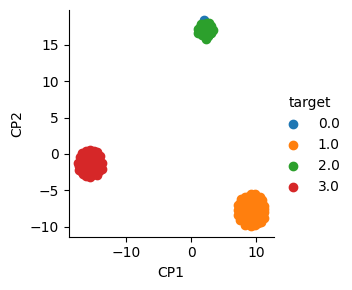

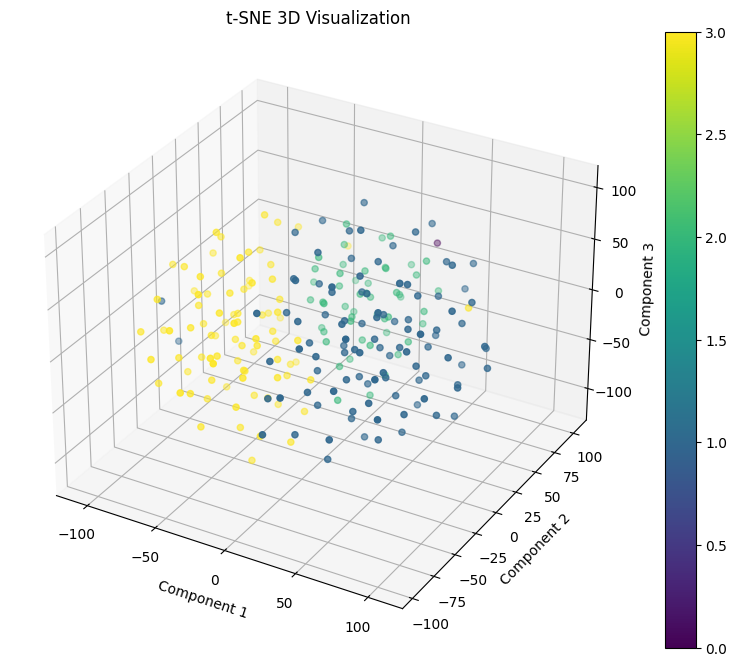

In [22]:
import pickle
import pandas as pd
df = pd.read_pickle('./results/quantity_skew_server240_client_weights.pkl')
cluster = df['cluster']
df.drop(columns='cluster')
print('')
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import datasets
from sklearn import manifold
import sklearn.manifold._t_sne as tsne
X = df
y= cluster
tsne = manifold.TSNE(n_components=2, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2', 'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
grid = sns.FacetGrid(tsne_df, hue="target")
grid.map(plt.scatter, 'CP1', 'CP2').add_legend()
X = df
y= cluster
tsne = manifold.TSNE(n_components=3, random_state=42)
mnist_tr = tsne.fit_transform(X)
# create dataframe
tsne_df = pd.DataFrame(columns=['CP1', 'CP2','CP3' ,'target'],
                       data=np.column_stack((mnist_tr, 
                                            cluster)))
# cast targets column to int
tsne_df.loc[:, 'target'] = tsne_df.target.astype(int)
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create a 3D scatter plot using Matplotlib directly
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the data points
scatter = ax.scatter(tsne_df['CP1'], tsne_df['CP2'], tsne_df['CP3'], c=tsne_df['target'], cmap='viridis')

# Set labels and title
ax.set_xlabel('Component 1')
ax.set_ylabel('Component 2')
ax.set_zlabel('Component 3')
ax.set_title('t-SNE 3D Visualization')

# Add color bar
plt.colorbar(scatter)

plt.show()

## Plot weight heatmap server SIDE

In [23]:
import torch
import glob
import os

from src.models import SimpleLinear
from src.metrics import plot_weights_heatmap
model = SimpleLinear()

# Define the directories
central_dir = "./results/quantity_skew_central"
client_dir = "./results/quantity_skew_client"
server_dir = "./results/quantity_skew_server"

# Function to load .pth files from a directory into a dictionary
def load_pth_files(directory):
    pth_files = glob.glob(directory + "*.pth")
    models_dict = {}
    for pth_file in pth_files:
        filename = os.path.basename(pth_file)[:-4]  # Remove ".pth" extension
        model = torch.load(pth_file)
        models_dict[filename] = model
    return models_dict

# Load models from each directory
central_models_dict = load_pth_files(central_dir)
client_models_dict = load_pth_files(client_dir)
server_models_dict = load_pth_files(server_dir)

In [24]:
import matplotlib.pyplot as plt
def plot_weights_heatmap(model,title,title2 = '', v_value=0.1 ):
    # Get the weights of the first and second layers
    first_layer_weights = model.fc1.weight.data.numpy()
    second_layer_weights = model.fc2.weight.data.numpy()

    # Create custom colormap
    cmap = 'coolwarm'

    # Plot the input weights of the first layer
    plt.figure(figsize=(5, 3))

    #plt.subplot(2, 1, 1)
    plt.imshow(first_layer_weights, cmap=cmap, aspect='auto', vmin=-v_value, vmax=v_value)
    plt.title(title)
    plt.xlabel('Input Pixel (784)')
    plt.ylabel('Neuron in Hidden Layer (200)')
    plt.colorbar(label='Weight Value')
    plt.tight_layout()
    #plt.savefig(title + '.jpg')  
    plt.show()
'''
    # Plot the output weights of the second layer
    plt.subplot(2, 1, 2)
    plt.imshow(second_layer_weights, cmap=cmap, aspect='auto', vmin=-v_value, vmax=v_value)
    plt.title(title2)
    plt.xlabel('Neuron in Hidden Layer(200)')
    plt.ylabel('Output Neuron (10)')
    plt.colorbar(label='Weight Value')

    plt.tight_layout()
    #plt.savefig(title + '.jpg')  
    plt.show()
    '''

"\n    # Plot the output weights of the second layer\n    plt.subplot(2, 1, 2)\n    plt.imshow(second_layer_weights, cmap=cmap, aspect='auto', vmin=-v_value, vmax=v_value)\n    plt.title(title2)\n    plt.xlabel('Neuron in Hidden Layer(200)')\n    plt.ylabel('Output Neuron (10)')\n    plt.colorbar(label='Weight Value')\n\n    plt.tight_layout()\n    #plt.savefig(title + '.jpg')  \n    plt.show()\n    "

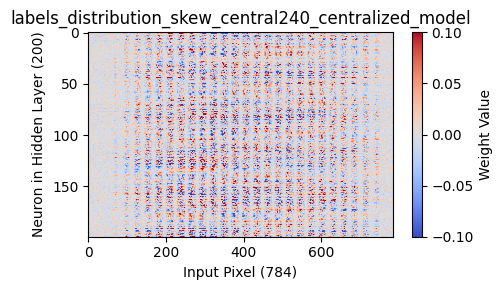

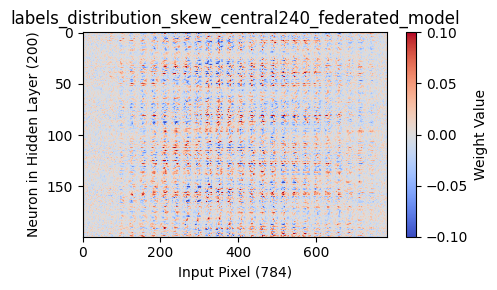

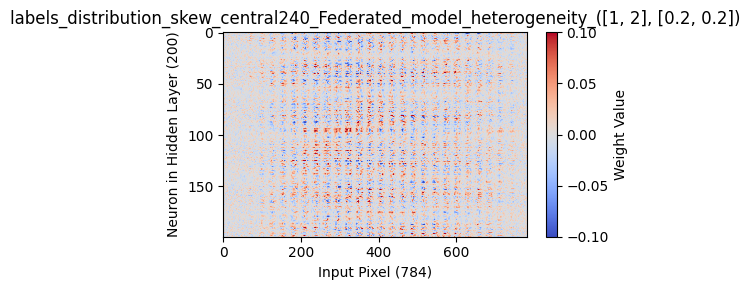

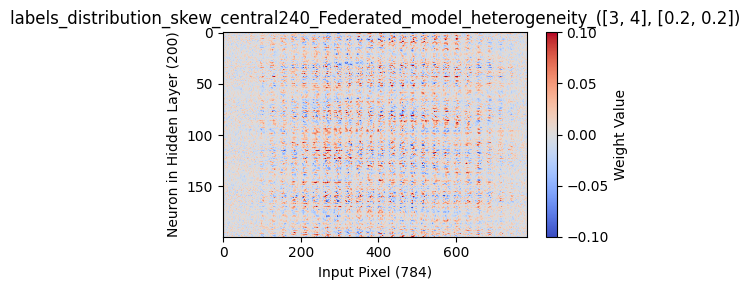

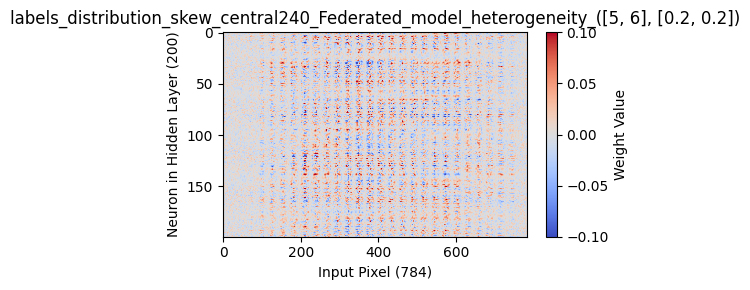

...

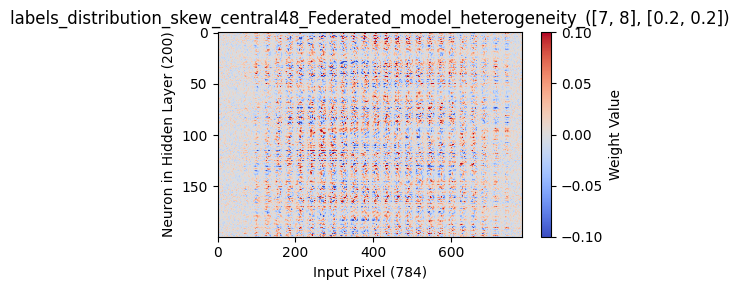

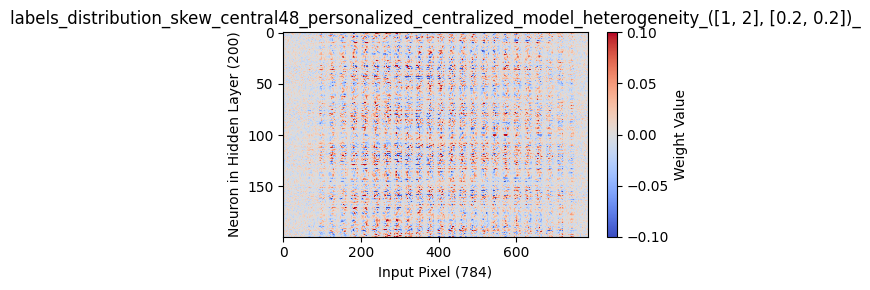

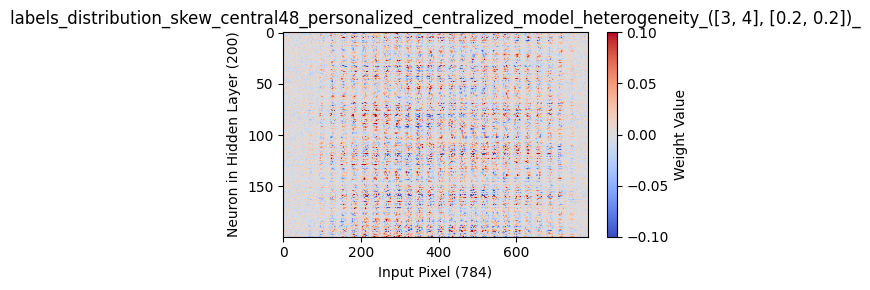

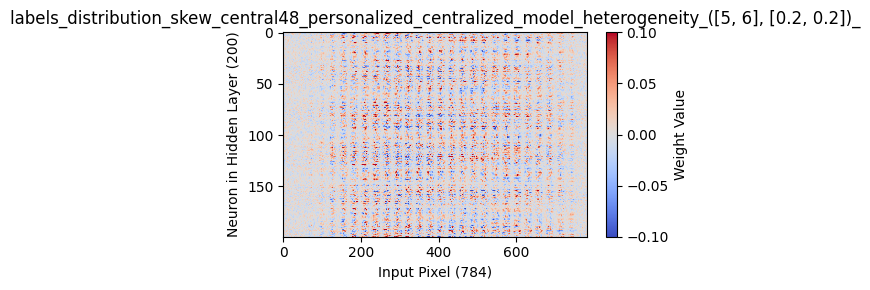

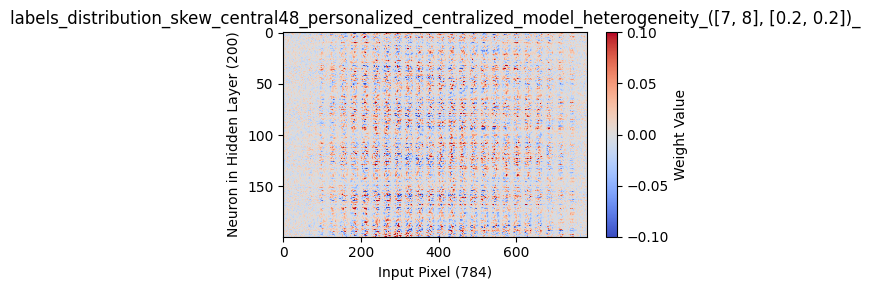

In [25]:
key_list =[]
for key in central_models_dict.keys() :
    key_list.append(key)
for key in key_list :
    model.load_state_dict(central_models_dict[key])
    plot_weights_heatmap(model,key)

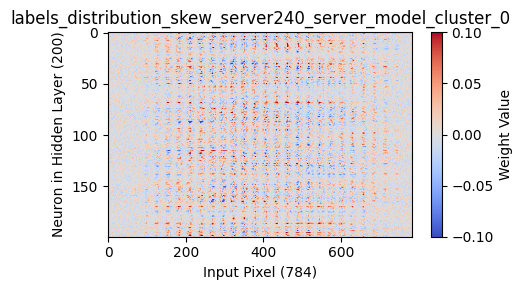

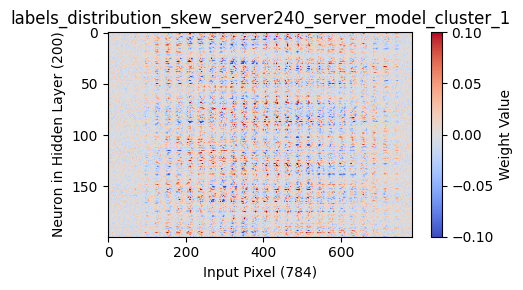

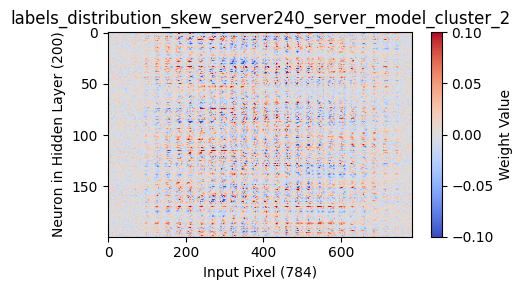

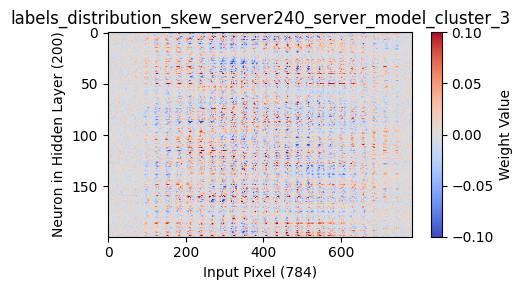

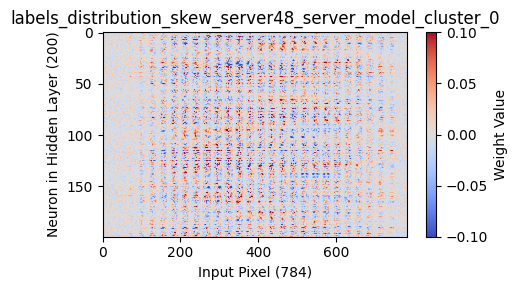

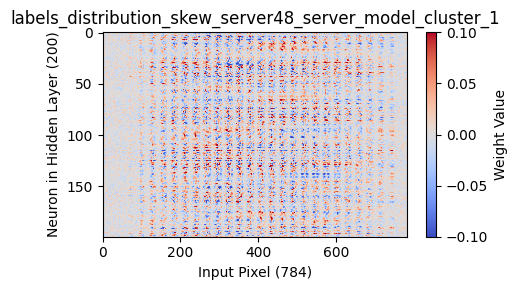

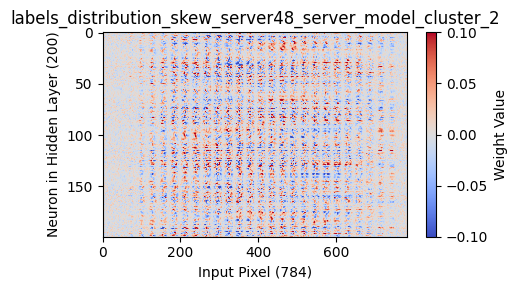

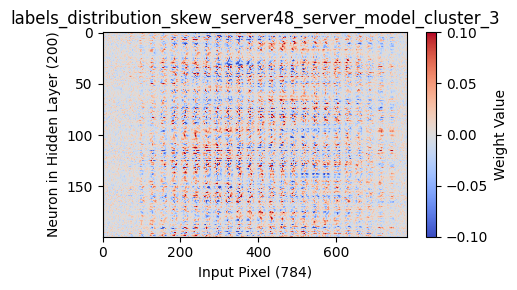

In [26]:
key_list =[]
for key in server_models_dict.keys() :
    key_list.append(key)
for key in key_list :
    model.load_state_dict(server_models_dict[key])
    plot_weights_heatmap(model,key)

# Similarity Matrix

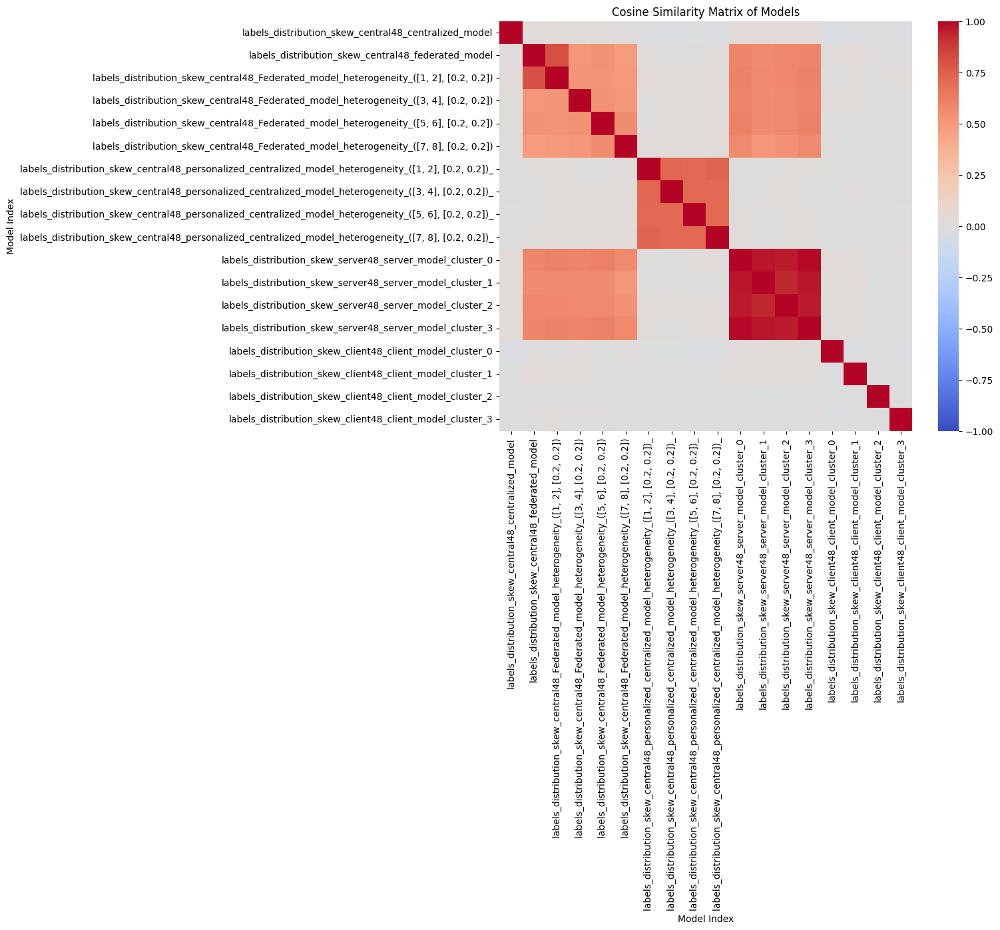

In [27]:
import torch
import glob
import os

from src.models import SimpleLinear
from src.metrics import plot_weights_heatmap
model = SimpleLinear()

# Define the directories
central_dir = "./results/quantity_skew_central48"
client_dir = "./results/quantity_skew_client48"
server_dir = "./results/quantity_skew_server48"
# Function to load .pth files from a directory into a dictionary
def load_pth_files(directory):
    pth_files = glob.glob(directory + "*.pth")
    models_dict = {}
    for pth_file in pth_files:
        filename = os.path.basename(pth_file)[:-4]  # Remove ".pth" extension
        model = torch.load(pth_file)
        models_dict[filename] = model
    return models_dict

# Load models from each directory
central_models_dict = load_pth_files(central_dir)
client_models_dict = load_pth_files(client_dir)
server_models_dict = load_pth_files(server_dir)
import torch
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import matplotlib.pyplot as plt
key_list =[]
for key in central_models_dict.keys() :
  key_list.append(key)
for key in server_models_dict.keys() :
  key_list.append(key)
for key in client_models_dict.keys() :
  key_list.append(key)
# Load all the models using their state dicts
concatenated_dict = {}

concatenated_dict.update(central_models_dict)
concatenated_dict.update(server_models_dict)
concatenated_dict.update(client_models_dict)
models = []
for key in key_list:
    model = model = SimpleLinear()
  # Instantiate your PyTorch model
    model.load_state_dict(concatenated_dict[key])
    models.append(model)

# Extract parameters and flatten them
parameters = [torch.cat([param.view(-1) for param in model.parameters()]) for model in models]

# Compute cosine similarity matrix
cos_sim_matrix = cosine_similarity(torch.stack(parameters).detach().numpy())

# Plot heatmap with labels but without annotations
plt.figure(figsize=(10, 8))
sns.heatmap(cos_sim_matrix, cmap='coolwarm', center=0, xticklabels=key_list, yticklabels=key_list, annot=False, vmin=-1, vmax=1)
plt.title('Cosine Similarity Matrix of Models')
plt.xlabel('Model Index')
plt.ylabel('Model Index')
plt.show()

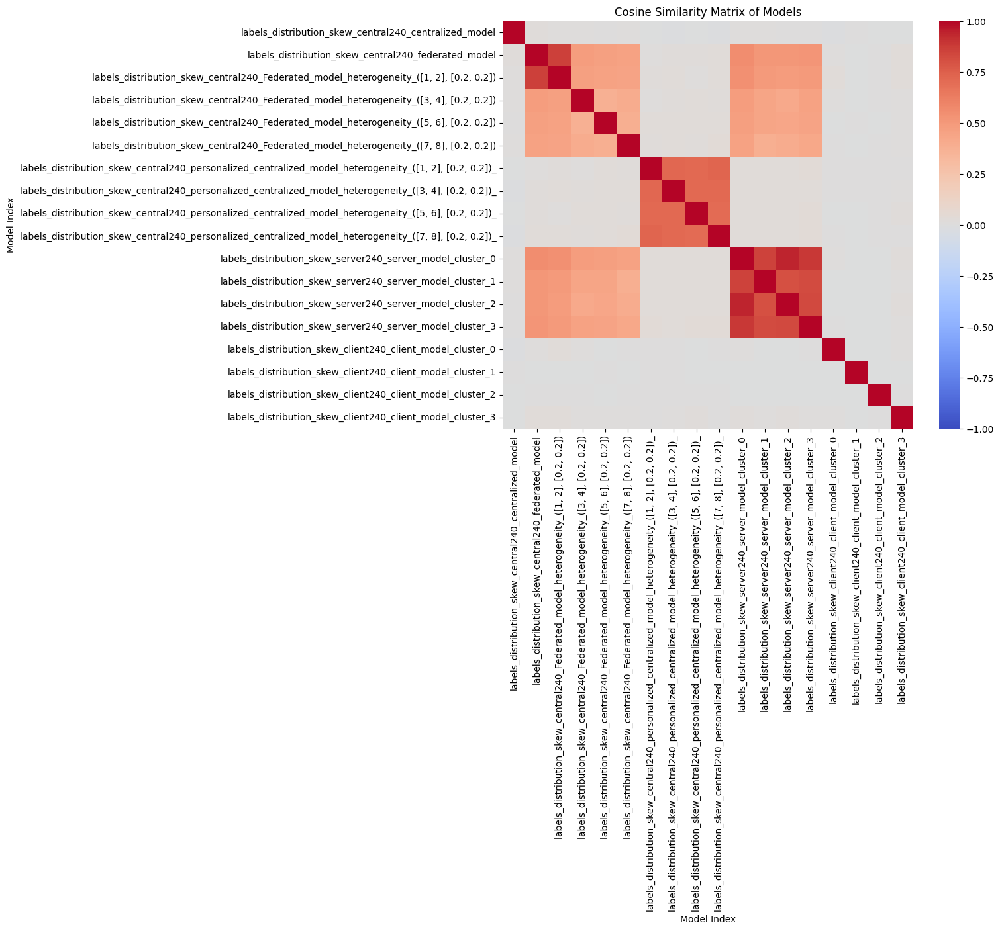

In [28]:
import torch
import glob
import os

from src.models import SimpleLinear
from src.metrics import plot_weights_heatmap
model = SimpleLinear()

# Define the directories
central_dir = "./results/quantity_skew_central240"
client_dir = "./results/quantity_skew_client240"
server_dir = "./results/quantity_skew_server240"

# Function to load .pth files from a directory into a dictionary
def load_pth_files(directory):
    pth_files = glob.glob(directory + "*.pth")
    models_dict = {}
    for pth_file in pth_files:
        filename = os.path.basename(pth_file)[:-4]  # Remove ".pth" extension
        model = torch.load(pth_file)
        models_dict[filename] = model
    return models_dict

# Load models from each directory
central_models_dict = load_pth_files(central_dir)
client_models_dict = load_pth_files(client_dir)
server_models_dict = load_pth_files(server_dir)
import torch
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import matplotlib.pyplot as plt
key_list =[]
for key in central_models_dict.keys() :
  key_list.append(key)
for key in server_models_dict.keys() :
  key_list.append(key)
for key in client_models_dict.keys() :
  key_list.append(key)
# Load all the models using their state dicts
concatenated_dict = {}

concatenated_dict.update(central_models_dict)
concatenated_dict.update(server_models_dict)
concatenated_dict.update(client_models_dict)
models = []
for key in key_list:
    model = model = SimpleLinear()
  # Instantiate your PyTorch model
    model.load_state_dict(concatenated_dict[key])
    models.append(model)

# Extract parameters and flatten them
parameters = [torch.cat([param.view(-1) for param in model.parameters()]) for model in models]

# Compute cosine similarity matrix
cos_sim_matrix = cosine_similarity(torch.stack(parameters).detach().numpy())

# Plot heatmap with labels but without annotations
plt.figure(figsize=(10, 8))
sns.heatmap(cos_sim_matrix, cmap='coolwarm', center=0, xticklabels=key_list, yticklabels=key_list, annot=False, vmin=-1, vmax=1)
plt.title('Cosine Similarity Matrix of Models')
plt.xlabel('Model Index')
plt.ylabel('Model Index')
plt.show()